# Numero di Transazioni Normalizzate (NTN) in Italia
## <font color="navy">Esame di Probabilità e Statistica </font>
### <font color="darkgreen"> Riccardo Beccaria - Andrea Sala </font>

Il progetto prevede l'analisi statistica del dataset redatto dall’Osservatorio del Mercato Immobiliare costruito incrociando gli archivi delle note di trascrizione degli atti di compravendita. Questo dataset illustra quanto gli immobili venogono acquistati e venduti nelle diverse aree italiane e nei diversi anni.
La variabile più importante contenuta nel dataset è il Numero di Transazioni Normalizzate (NTN). Citando l'Osservatorio del Mercato Immobiliare:

"*il parametro NTN è la somma delle unità immobiliari compravendute “normalizzate” rispetto alla quota trasferita; ciò significa che se un’unità immobiliare è compravenduta in quota, per esempio il 50% della proprietà, essa non è contata come un’unità compravenduta, bensì come 0,5 NTN"*

Oltre al valore di NTN, nel dataset sono presenti altre variabili che indicano l'NTN diviso per metratura dell'immobile. La somma di tutte queste variabili dovrà dunque restituire nuovamente l'NTN.

Nel dataset l'informazione è divisa per anno, dunque ogni entry rappresenta l'NTN prodotto da un certo comune italiano durante un certo anno.

L'obiettivo di questo progetto sarà dunque estrarre informazioni da questo dataset, in particolare:
- Quali aree italiane (e quali province) presentano un NTN maggiore
- L'andamento dell'NTN nel tempo
- La distribuzione statistica dell'NTN
- Quali variabili del dataset sono maggiormente correlate con l'NTN

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import pandas as pd
import numpy as np
import scipy
import seaborn as sns
import matplotlib.pylab as plt
from tqdm import trange
import math

import geopandas as gpd

sns.set(rc={'figure.figsize':(11.7,8.27)})

### Caricamento del dataset e preprocessing

Dopo aver caricato correttamente i dati, eseguiamo innanzitutto delle operazioni di pulizia, rimuovendo tutti i duplicati, i valori nulli e quelli che presentano un numero di transazioni normalizzate negativo. Inoltre, alcuni valori del codice comunale sono invalidi, dunque andiamo a eliminare anche quelli.

Infine, andiamo a creare un altro dataframe raggruppando le entries in base alla provincia di provenienza. in questo modo otteniamo un dataset più *coarse-grained* e possiamo procedere con uno studio geografico dell'NTN.

In [2]:
df = pd.read_csv('NumeroTransazioniNormalizzate.csv', usecols=range(1,12)).dropna().drop_duplicates()
df = df[df["NTN"]>0]
df = df[df["CodCom"]!="n*"]

In [3]:
conversion = {"AP":"AC", "BA":"BB", "CA": "CG", "FG":"FA", "MI": "MA", "NU":"NR", "OR":"ON", "SS": "SX"}
df["prov"] = df["prov"].replace(conversion)

In [4]:
df_gr = df.groupby("prov")["NTN"].mean().round(1)

### Visualization sul territorio nazionale

In [5]:
provs = gpd.read_file("prov-ita.json").drop(columns=["id", "id_0","name_0","type_2", "engtype_2", "iso", "varname_2", "ccn_2", "nl_name_2"])
provs['prov'] = provs['hasc_2'].str[-2:]
provs = provs.drop(columns=["cca_2", "id_1","id_2","hasc_2"])

In [6]:
tot = pd.merge(df_gr, provs, on="prov")
tot = gpd.GeoDataFrame(tot)
tot.sample(4)

,prov,NTN,name_1,name_2,geometry
43,LO,38.0,Lombardia,Lodi,"MULTIPOLYGON (((9.47267 45.44909, 9.47364 45.4..."
63,PN,52.4,Friuli-Venezia Giulia,Pordenone,"MULTIPOLYGON (((12.52209 46.38987, 12.52460 46..."
22,CN,25.4,Piemonte,Cuneo,"MULTIPOLYGON (((7.47250 44.76340, 7.47227 44.7..."
36,IM,44.4,Liguria,Imperia,"MULTIPOLYGON (((7.79562 44.13163, 7.81638 44.1..."


In [7]:
tot.explore(
     column="NTN",
     tooltip=["prov","NTN"], 
     tiles="CartoDB positron", 
     cmap="viridis", 
     style_kwds=dict(color="black")
    )

In questa cartina italiana si può vedere il valore dell'NTN per le diverse province italiane, mediata su tutti gli anni e su tutti i comuni. Come ci si poteva aspettare, la provincia di Roma è quella che presenta un valore maggiore. Ci si può attendere di avere una maggiore compravendita degli immobili nei luoghi più popolati o nelle mete turistiche italiane. Infatti, oltre a Roma, sono i centri storici italiani come Firenze, Milano, Bologna e Ravenna quelli che presentano un valore di NTN medio più elevato. 

### Andamento NTN e correlazioni

In [8]:
df

,AREA,Regione,prov,CodCom,NTN < 50 mq,NTN 50-85 mq,NTN 85-115 mq,NTN 115-145 mq,NTN > 145 mq,NTN,Anno
0,Nord Ovest,Liguria,GE,A388,20.05,50.96,35.00,9.45,7.00,122.46,2012
1,Nord Ovest,Liguria,GE,A506,1.00,8.50,11.24,4.00,5.00,29.74,2012
2,Nord Ovest,Liguria,GE,A658,1.33,7.34,11.17,5.50,2.83,28.17,2012
3,Nord Ovest,Liguria,GE,A922,3.00,15.50,9.50,8.00,2.00,38.00,2012
4,Nord Ovest,Liguria,GE,B067,3.50,2.00,12.00,1.00,3.50,22.00,2012
...,...,...,...,...,...,...,...,...,...,...,...
158763,Nord Ovest,Lombardia,MA,M424,7.50,36.00,30.50,10.50,16.00,100.50,2019
158764,Nord Ovest,Lombardia,VA,M425,2.00,6.50,11.33,4.00,4.00,27.83,2019
158765,Nord Est,Veneto,VI,M426,0.00,1.00,6.00,4.00,4.00,15.00,2019
158766,Nord Est,Veneto,VI,M427,7.00,23.44,19.76,9.62,13.01,72.83,2019


In [9]:
df.AREA = pd.Categorical(df.AREA)
df['AREA_code'] = df.AREA.cat.codes

df.Regione = pd.Categorical(df.Regione)
df['Regione_code'] = df.Regione.cat.codes

df.prov = pd.Categorical(df.prov)
df['prov_code'] = df.prov.cat.codes

df.CodCom = pd.Categorical(df.CodCom)
df['CodCom_code'] = df.CodCom.cat.codes


Nord Ovest: ['Liguria', 'Lombardia', 'Piemonte', "Valle d'Aosta"]
Nord Est: ['Emilia-Romagna', 'Friuli- Venezia Giulia', 'Veneto']
Centro: ['Lazio', 'Marche', 'Toscana', 'Umbria']
Sud: ['Abruzzo ', 'Basilicata', 'Calabria', 'Campania', 'Molise', 'Puglia', 'Abruzzo']
Isole: ['Sardegna', 'Sicilia']


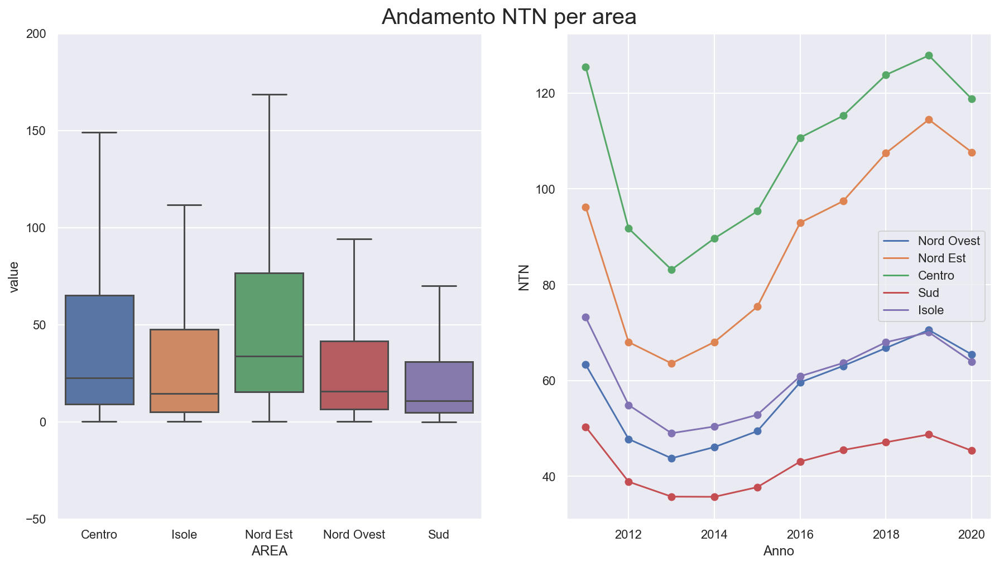

In [10]:
df_melt=pd.melt(df,id_vars=["AREA"],value_vars=["NTN"])
clrs = ["crimson", "darkgreen","navy", "purple", "darkorange"]

for area in df["AREA"].unique():
    print(f"{area}:", df[df["AREA"]==area]["Regione"].unique().tolist())


curves=[]
for name in df["AREA"].unique():
    Area=[]
    for anno in range(2011, 2021):
        df_temp=df.loc[df['AREA'] == name]
        set1=df_temp[df_temp["Anno"]==anno].NTN
        value=set1.mean()
        if math.isnan(value) == True:
            value=0
        points=[anno,name,value]
        Area.append(points)
    curves.append(Area)

fig, ax= plt.subplots(1,2,figsize=(15,8))
sns.boxplot(data=df_melt, x="AREA", y="value",  fliersize=0, ax=ax[0])
ax[0].set_ylim(ymin=-50, ymax=200)

years=[]
for i in range(0,5):
    x=[]
    y=[]
    for j in range(0,10):
        x.append(curves[i][j][0])
        y.append(curves[i][j][2])
        
    ax[1].plot(x,y,label=curves[i][j][1])
    ax[1].scatter(x,y)
    years.append(y)
    
ax[1].legend(loc='best')
ax[1].set_xlabel("Anno")
ax[1].set_ylabel("NTN")

plt.suptitle("Andamento NTN per area", y=0.92, fontsize=20)
plt.show()
    

Nel primo grafico abbiamo mostrato tramite un boxplot le distribuzioni dell'NTN mediato su tutti gli anni, per ogni area italiana. Abbiamo ipotizzato che una distribuzione con quartili così distanti rispetto alla posizione della media fosse dovuta a una elevata fluttuabilità dell'NTN al variare degli anni. Per questo motivo abbiamo deciso di studiare l'andamento dell'NTN in funzione degli anni per ogni singola area italiana. Ogni punto della curva è stato ottenuto mediando il valore NTN per ogni comune di quella data Area a quel dato anno.
Il risultato ottenuto verifica l'ipotesi per cui abbiamo deciso di studiare queste curve: l'andamento dell'NTN in funzione degli anni presenta una grande flessibilità. Ad esempio, il Centro italia presenta il massimo valore NTN (raggiunto nel 2019) maggiore di circa del 50% del valore minimo.

L'andamento del mercato immobiliare italiano si uniforma in tutte le Aree italiane presentando lo stesso andamento in funzione degli anni. Ci siamo interrogati sui motivi del crollo e della ripresa del mercato. Come è intuitivo, abbiamo immaginato che il crollo fosse strettamente relazionato alla crisi economica del paese, mentre la ripresa al finanziamento da parte dello stato o dall'Unione Europea sul mercato immobiliare. Fonti degli Uffici di Tecnocasa confermano questa ipotesi.



<font color="green">Elaborazione Uffici Studi Gruppo Tecnocasa su dati Agenzia delle Entrate</font>

https://www.idealista.it/news/immobiliare/residenziale/2021/05/25/154163-andamento-del-mercato-immobiliare-dal-2008-ad-oggi

- 2012: “annus horribilis” per il mercato immobiliare italiano: si registra la contrazione dei prezzi più importante (-10,2% in un solo anno) ed i volumi di compravendita iniziano a precipitare (-25,8% rispetto al 2011) a causa di mancanza di fiducia, di una congiuntura economica ancora fortemente negativa e un aumento del costo dei mutui che rende più difficoltoso l’accesso al credito. A questo si aggiunge la pressione fiscale che, incidendo soprattutto sulle seconde case, determina un aumento di offerta immobiliare.


- 2014: i mutui ripartono, la domanda di credito delle famiglie è in salita e la BCE immette liquidità sui mercati finanziari attraverso il Quantitative Easing. Riparte la fiducia delle imprese e dei consumatori. Tutto questo determina un aumento della domanda immobiliare che diventa nel frattempo più selettiva. Aumento le transazioni, mentre i prezzi ancora non decollano.

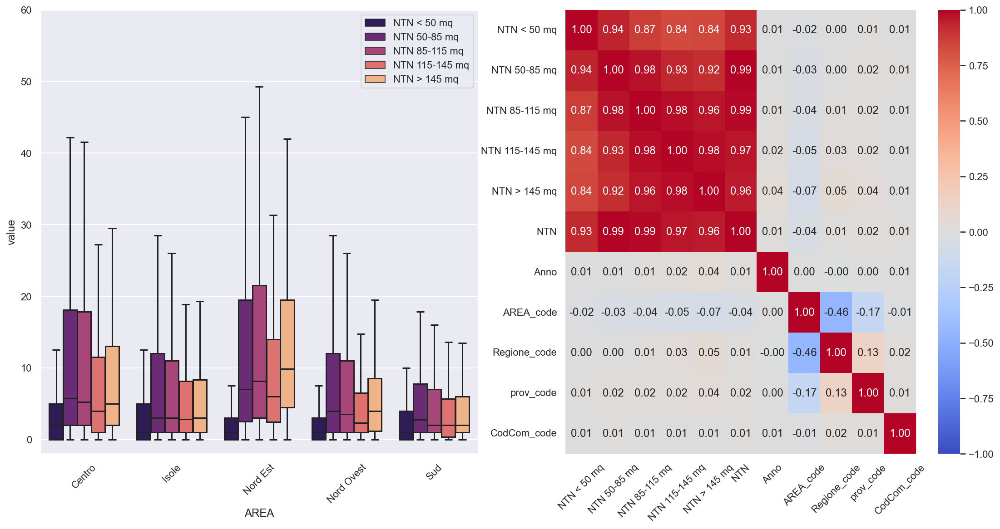

In [26]:
df_melt=pd.melt(df,id_vars=["AREA"],value_vars=['NTN < 50 mq','NTN 50-85 mq','NTN 85-115 mq','NTN 115-145 mq', 'NTN > 145 mq'])

fig, ax= plt.subplots(1,2,figsize=(19,9))
sns.boxplot(data=df_melt, x="AREA", y="value", hue="variable", palette="magma", fliersize=0, ax=ax[0])
ax[0].set_ylim(ymin=-2, ymax=60)
ax[0].legend(loc='upper right')
sns.heatmap(df.corr(), vmin=-1, vmax=1, 
                 annot=True, fmt='.2f', cmap="coolwarm", #colormap divergente
                 ax=ax[1])
for axs in ax.flat:
    axs.set_xticklabels(axs.get_xticklabels(), rotation=45)

Nel boxplot di sinistra, realizzato con l'aiuto della libreria seaborn, si osserva la distribuzione dell'NTN sulle varie metrature, diviso per area del territorio nazionale. Un dato interessante che si nota subito è che l'NTN sugli immobili con superficie minore di 50mq è molto minore di tutti gli altri campi. Gli altri 4 campi sono invece distribuiti in maniera simile indipendentemente dall'area su cui li stiamo analizzando.


Osservando la matrice di correlazione, si verifica lo stesso fenomeno: nonostante tutti i coefficienti di correlazione tra i vari valori di NTN siano molto alti (come è ovvio), si nota che il coefficiente di correlazione tra l'NTN<50mq e NTN totale è il minore. Interpretiamo questa caratteristica con l'assunzione che le transazioni immobiliari relative a superfici minori di 50mq accadono in numero molto inferiore rispetto al totale; in questo modo non "riescono" a influenzare in modo significativo il valore totale di NTN.

### Test Statistici

In [27]:
set1=df[df["AREA"]=='Nord Ovest'].NTN
set2=df[df["AREA"]=='Nord Est'].NTN
set3=df[df["AREA"]=='Centro'].NTN
set4=df[df["AREA"]=='Sud'].NTN
set5=df[df["AREA"]=='Isole'].NTN

In [28]:
reg = df["AREA"].unique()
sets =[set1 ,set2, set3, set4, set5]


print("p-value per vedere se due curve temporali delle aree italiane hanno lo stesso NTN medio:\n")


for i in range(5):
    j=i+1
    while j<5:
        D,p=scipy.stats.ks_2samp(years[i],years[j])
        print('{:>6} e {:>5}:  {:>.8f}'.format(reg[i], reg[j], p))
       
        j+=1

p-value per vedere se due curve temporali delle aree italiane hanno lo stesso NTN medio:

Nord Ovest e Nord Est:  0.00205677
Nord Ovest e Centro:  0.00001083
Nord Ovest e   Sud:  0.05244755
Nord Ovest e Isole:  0.78692979
Nord Est e Centro:  0.16782134
Nord Est e   Sud:  0.00001083
Nord Est e Isole:  0.01234060
Centro e   Sud:  0.00001083
Centro e Isole:  0.00001083
   Sud e Isole:  0.00021650


In questa sezione, abbiamo voluto studiare con dei test statistici le distribuzioni dell'NTN suddiviso per Aree geografiche in funzione dell'anno. Dal grafico precedente si osserva che l'andamento del 'Nord Ovest' assomiglia molto a quello delle 'Isole' e del 'Sud', mentre il 'Nord Est' assomiglia al 'Centro' Italia. Per questa ragione abbiamo deciso di compiere un KS-test per verificare l'ipotesi nulla che le distribuzioni presentino la stessa media. Abbiamo deciso di prendere $\alpha=0.05$ come livello di significatività.

1. Per le distribuzioni del 'Nord Ovest'-'Sud', 'Nord Ovest'-'Isole' e 'Nord Est'-'Centro' abbiamo ottenuto un p-value minore del livello si significatività. In particolare:
- $p_{o-s}=0.0524$
- $p_{o-i}=0.7869$
- $p_{e-c}=0.1678$

E dal momento che $p>\alpha$ non possiamo rigettare l'ipotesi nulla che queste distribuzioni presentino la stessa media. 

2. Per tutte le restanti coppie di distribuzioni osserviamo un p valore minore del livello di significatività: $p<\alpha$. Questo ci permette di rigettare le ipotesi che queste distribuzioni presentino la stessa media.

Anche se questi test statistici non ci consentono di affermare che due distribuzioni presentano la stessa media, possono quantomeno dirci quali di queste distribuzioni sicuramente non presentano la stessa media con una significatività $S=1-\alpha=0.95$

### Fit della distribuzione di NTN

Dopo aver osservato l'istogramma dell'NTN, abbiamo deciso di provare a fittare il logaritmo di tale variabile, perchè presenta una forma a campana che ricorda molto quella di una gaussiana. 
I dati sono stati fittati con una gaussiana e con una distribuzione gamma 
$$ f(x; \theta,\kappa) = \frac{1}{\Gamma(k)\theta^k} x^{k-1}e^{-\frac{x}{\theta}} $$

In [29]:
df["NTN"].describe()

count    74041.000000
mean        65.832722
std        475.093535
min          0.030000
25%          6.670000
50%         17.000000
75%         48.100000
max      33531.730000
Name: NTN, dtype: float64

In [30]:
y = df["NTN"]
ylog=np.log(y)

locG,scaleG = scipy.stats.norm.fit(ylog)
GAUSS = scipy.stats.norm(loc=locG, scale=scaleG)

a,loc,scale = scipy.stats.gamma.fit(ylog)
GAMMA = scipy.stats.gamma(a=a, loc=loc, scale=scale)

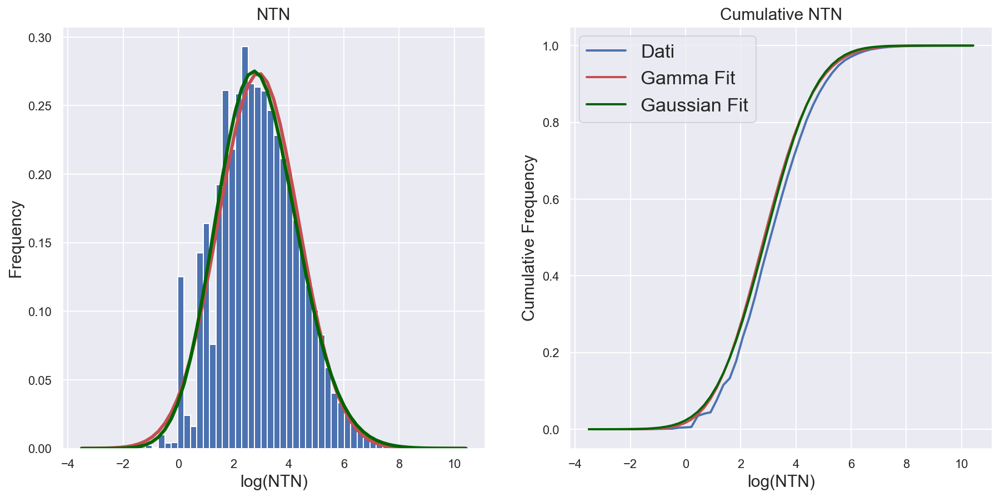

In [31]:
fig, ax= plt.subplots(1,2,figsize=(15,7))
Nbins= 60

xmin = np.min(ylog)
xmax = np.max(ylog)
x = np.linspace(xmin, xmax, Nbins+1)

cols, binz, graphics = ax[0].hist(ylog, bins=Nbins, density=True)
ax[0].plot(x, GAUSS.pdf(x)*1, color = 'r', label = 'Gauss', linewidth=3)
ax[0].plot(x, GAMMA.pdf(x)*1, color = 'darkgreen', label = 'Gamma', linewidth=3)
ax[0].set_xlabel("log(NTN)", fontsize=15)
ax[0].set_ylabel("Frequency", fontsize=15)
ax[0].set_title("NTN",fontsize=15)

ylog = np.sort(ylog)


cumul=[0]
for i in range(len(cols)):
    cumul.append(np.sum(cols[0:i]))
    
cumulNorm = [i/np.max(cumul) for i in cumul]

ax[1].set_xlabel('log(NTN)', fontsize=15)
ax[1].set_ylabel('Cumulative Frequency', fontsize=15)
ax[1].plot(binz, cumulNorm, label='Dati', linewidth=2)
ax[1].plot(x, GAMMA.cdf(x), label="Gamma Fit", color='r', linewidth=2)
ax[1].plot(x, GAUSS.cdf(x), label="Gaussian Fit", color='darkgreen', linewidth=2)
ax[1].legend(fontsize='x-large')
ax[1].set_title('Cumulative NTN',fontsize=15)


newBase = np.zeros(Nbins)
for i in range(Nbins):
    newBase[i] = (binz[i] + binz[i+1])/2

#totCols = np.sum(cols)
#cols = cols/totCols

plt.show()


In [32]:
chi1, p1 = scipy.stats.kstest(cumulNorm, GAMMA.cdf(x))
chi2, p2 = scipy.stats.kstest(cumulNorm, GAUSS.cdf(x))

In [33]:
print("* ***********************  FIT RESULTS *********************** *")
print("*                                                              *")
print(f"*              Gamma: KS={chi1:.4f}, p-value = {p1:.4f}              *")
print(f"*              Gauss: KS={chi2:.4f}, p-value = {p2:.4f}              *")
print("*                                                              *")
print("* ************************************************************ *")

* ***********************  FIT RESULTS *********************** *
*                                                              *
*              Gamma: KS=0.0820, p-value = 0.9878              *
*              Gauss: KS=0.1311, p-value = 0.6748              *
*                                                              *
* ************************************************************ *


I risultati del fit, insieme con la cumulativa, sono mostrati in figura. Entrambe le curve teoriche mostrano un ottimo accordo con i dati sperimentali. Per quantificare questo accordo, è stato eseguito il test di Kolmogorov-Smirnov per estrarre un p-value. Entrambi i fit possono considerarsi molto buoni, visto l'alto valore di significatività del test statistico.

### PCA

In [34]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

df = df[df.NTN < 200]

X = df.drop(['NTN 50-85 mq','NTN 115-145 mq', 'NTN','AREA','Regione','prov','CodCom'],axis=1)
y = df['NTN']

X = scaler.fit_transform(X)

dfx = pd.DataFrame(data=X,columns=['NTN < 50 mq','NTN 85-115 mq','NTN > 145 mq','Anno',
                                   'AREA_code','Regione_code',
                                   'Prov_code','CodCom_code'])

In [35]:
from sklearn.decomposition import PCA
pca = PCA(n_components=None)
df_pca = pca.fit(dfx)

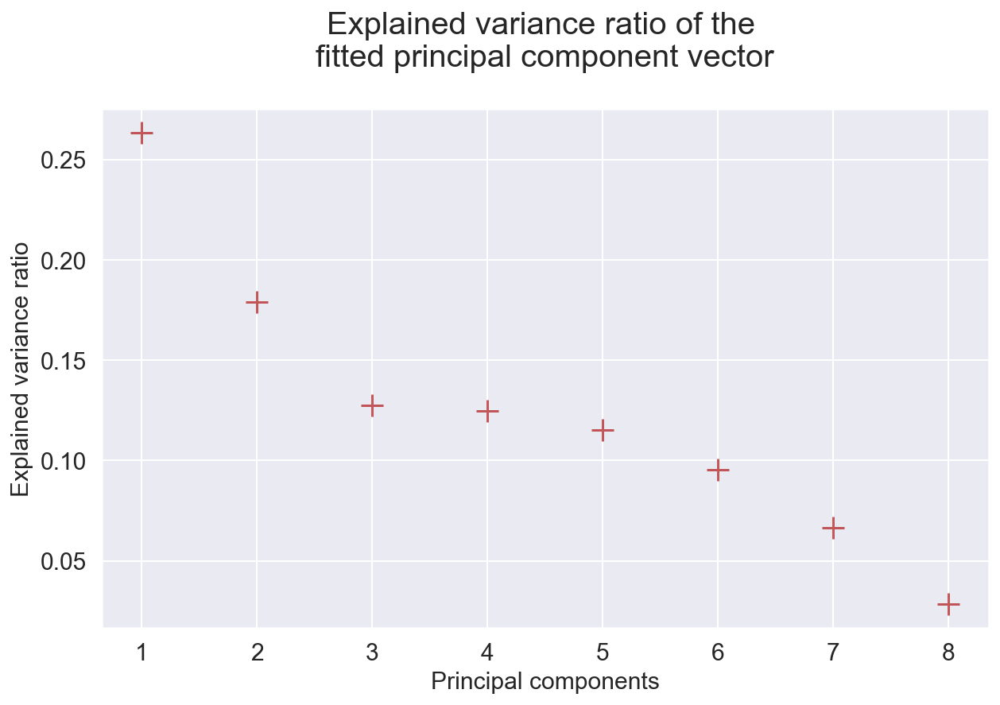

In [36]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(df_pca.explained_variance_ratio_))],
            y=df_pca.explained_variance_ratio_,
           s=200, alpha=0.75,c='firebrick',marker='+')
plt.grid(True)
plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=20)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(df_pca.explained_variance_ratio_))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

Questo grafico descrive quanto ciascuna componente ottenuta dalla PCA è in grado di spiegare il valore dell'NTN che si ottiene. La prima componente principale è l'autovettore relativo all'autovalore maggiore della matrice di correlazione diagonalizzata del dataset, e così le altre. Le prime due componenti principali della PCA spiegano circa il 40% del valore dell'NTN: ci aspettiamo che in uno spazio tridimensionale, i dati si dispongano intorno a una retta.

In [37]:
dfx_trans = pca.transform(dfx)
dfx_trans = pd.DataFrame(data=dfx_trans)

In [100]:
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3

fig = plt.figure(figsize=(10,8))
axx= p3.Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(axx)

X,Y,Z=dfx_trans[0],dfx_trans[1],dfx_trans[2]
axx.scatter(X,Y,Z, marker=".", vmin=0,vmax=200, c=df["NTN"],cmap="coolwarm",alpha=0.75)
axx.set_title("3D RW")
axx.set_xlabel("X")
axx.set_ylabel("Y")
axx.set_zlabel("Z")
for ii in trange(0,360,1):
    axx.view_init(elev=10., azim=ii)
    plt.savefig("./figs/movie%03d.png" % ii)
plt.close()

100%|█████████████████████████████████████████| 360/360 [08:57<00:00,  1.49s/it]


In [22]:
import os
#os.system('cd figs')
#os.system('ffmpeg -framerate 24 -i movie%03d.png -vf format=yuv420p pca.mp4')

from IPython.display import Video
Video("./figs/pca.mp4")

In questo filmato abbiamo rappresentato come vengono distribuiti i valori dell'NTN nello spazio tridimensionale ottenuto tramite le tre componenti principali che si ottengono attraverso la Principal Component Analysis. Come ci si poteva aspettare, dopo aver visto il grafico precedente, il valore dell'NTN risulta essere praticamente definito dai valori delle prime due componenti principali. Infatti l'NTN cresce lungo una retta definita da X e da Y: piccoli valori di NTN rappresentati in Blu, grandi valori rappresentati in Rosso.

### Discussione dei risultati ottenuti

Il centro del nostro lavoro è stato cercare di capire le ragioni dell'andamento osservato del mercato immobiliare, e proporre un metodo, per stimare il valore dell'NTN, più rapido rispetto al censire ogni immobile compravenduto.

Il plot provinciale del valore dell'NTN nella cartina all'inizio del notebook mostra come il valore dell'NTN sia tanto maggiore tanto più siamo vicini a città popolate o a luoghi turistici. Infatti, ad avvalorare la nostra ipotesi, le province di Roma, Milano, Firenze, Bologna, Venezia e Ravenna sono quelle che presentano una maggiore compravendita sul territorio italiano.

Lo studio nel Boxplot della distribuzione dell'NTN per 'Area' geografica italiana e il relativo andamento in funzione degli anni, ha mostrato da una parte un'omogeneità di comportamento nelle diverse aree geografiche italiane. Dall'altra ha evidenziato come nel corso degli anni sia molto cambiato il mercato immobiliare. Intorno al 2012-2013 si è osservato un crollo del mercato immobiliare, mentre negli anni successivi si può vedere una lenta ripresa del mercato fino al 2020, anno della pandemia da COVID-19. Come già spiegato in precedenza, il motivo del crollo è dovuto alla forte crisi economica che ha investito il paese in quegli anni, mentre la ripresa degli anni successivi è dovuta all'immissione di liquidità da parte della BCE nei mercati finanziari.

Nel secondo Boxplot e nella matrice di correlazione del dataset abbiamo studiato come sono distribuite le compravendite a seconda della metratura dell'immobile e in funzione della relativa area geografica. Abbiamo osservato che l'NTN degli immobili con metratura inferiore ai 50 mq, è di gran lunga minore del valore delle compravendite per i restanti immobili: con la matrice di correlazione abbiamo potuto mostrare che le compravendite degli immobili con metratura minore di 50 mq influenzano minormente il valore finale dell'NTN rispetto ai restanti immobili.

Con i test statistici abbiamo potuto caratterizzare maggiormente il dataset, mostrando che in alcuni casi non possiamo rigettare l'ipotesi che le distribuzioni dell'NTN in funzione dell'anno per diverse aree geografiche presentino stesso valore medio dell'NTN. Abbiamo condotto questi test statistici attraverso uno z-test in cui abbiamo confrontato tutte le possibili coppie di distribuzioni differenziate per aree geografiche.

Uno dei risultati principali del nostro studio è stato ottenuto tramite l'osservazione della riduzione dimensionale del dataframe condotta tramite PCA. Abbiamo infatti ottenuto che nello spazio ridotto, i dati si distribuiscono attorno a una retta. Questo comportamento non ci ha stupito. Infatti nel Dataframe con cui abbiamo svolto la riduzione dimensionale abbiamo mantenuto alcuni label relativi al valore dell'NTN per metratura quadrata. Abbiamo tenuto i valori estremali della metratura dell'NTN (gli immobili con metratura minore di 50 mq e maggiore di 145 mq), e il valore dell'NTN degli immobili con metratura compresa tra 85mq e 115mq. Questo risultato è molto interessante se si vuole immaginare un nuovo metodo per stimare il valore della compravendita degli immobili in un comune. Abbiamo infatti mostrato con questa PCA che per stimare il valore dell'NTN per un dato comune, sarebbe sufficiente censire le compravendite per alcuni immobili con una specifica metratura quadrata evitando così di dover tenere traccia di tutti gli immobili all'interno di un comune.